# Рынок заведений общественного питания Москвы

В нашем распоряжении датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Нужно подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Цели исследования:**

- Провести исследование рынка заведений общественного питания Москвы
- Дать рекомендации по выбору места и категории заведения общественного питания

**Ход исследования:**

1. Обзор данных
2. Предобработка данных
3. Анализ данных
4. Детализирование исследования
5. Презентация
6. Общий вывод

## Обзор данных

In [1]:
# Импортируем нужные нам библиотеки

import pandas as pd
import numpy as np
from plotly import graph_objects as go
import plotly.express as px
import seaborn as sns
import folium
from matplotlib import pyplot as plt
from folium import Marker, Map, Choropleth
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

In [2]:
# Читаем данные

rests = pd.read_csv('/datasets/moscow_places.csv') 

In [3]:
# Выводим общую информацию

rests.info()
rests.sample(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
4915,Цинандали,ресторан,"Москва, Большая Андроньевская улица, 25/33",Центральный административный округ,"ежедневно, 11:00–23:00",55.739984,37.671988,4.2,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,66.0
6375,Coffeesphere,кофейня,"Москва, улица Архитектора Щусева, 2, корп. 2",Южный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.699194,37.634960,4.5,средние,Цена чашки капучино:от 200 ₽,NaN,200.0,1,NaN
6346,Mangal House,быстрое питание,"Москва, улица Мастеркова, 4",Южный административный округ,"ежедневно, 10:00–21:00",55.708339,37.656128,4.4,средние,Средний счёт:300–430 ₽,365.0,NaN,0,82.0
6210,Eda premium,ресторан,"Москва, улица Пудовкина, 3",Западный административный округ,"ежедневно, 10:00–23:00",55.726986,37.531205,4.2,высокие,Средний счёт:1500–4000 ₽,2750.0,NaN,0,40.0
4713,Кочевники,ресторан,"Москва, улица Сретенка, 5, стр. 1",Центральный административный округ,"пн-чт 11:00–00:00; пт,сб 11:00–02:00; вс 11:00...",55.767285,37.631414,4.5,выше среднего,Средний счёт:1000–2000 ₽,1500.0,NaN,0,155.0


### Помежуточный вывод по этапу обзора данных

В таблице 8406 строк, названия столбцов соответствуют "змеиному" регистру. Присутствует огромное количество пропусков. С типами данных все в порядке, кроме столбца с количеством посадочных мест, тут можно изменить тип данных на int.

## Предобработка данных

Сначала обработаем пропущенные значения

In [4]:
# rests.isna().sum()

pd.DataFrame(round(rests.isna().mean()*100,1)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.600000
avg_bill,54.600000


Создадим новые столбцы для дальнейшего исследования, заодно заполним пропуски в часах работы значением "unknown".

In [5]:
rests['hours'] = rests['hours'].fillna('unknown')

# Пишем функции для создания новых столбцов

def street_name(row):
    beginning = row['address'].find(',') # находим первую запятую
    ending = row['address'].find(',', beginning + 1, len(row['address']) - 1) # находим вторую запятую
    return row['address'][beginning + 2: ending] # возвращаем строку, находящуюся между первыми двумя запятыми

def is_24_7(row):
    if row['hours'] == 'ежедневно, круглосуточно':
        return True
    elif row['hours'] == 'unknown': # там, где неизвестен график работы, вернем NaN
        return np.nan
    else:
        return False

# Применяем функции к столбцам    
    
rests['street'] = rests.apply(street_name, axis=1)
rests['is_24/7'] = rests.apply(is_24_7, axis=1)
rests.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3386,+39 Pizzeria Mozzarella bar,пиццерия,"Москва, Столярный переулок, 3, корп. 12",Центральный административный округ,"пн-чт 12:00–22:00; пт,сб 12:00–23:00; вс 12:00...",55.764166,37.568816,4.8,NaN,NaN,NaN,NaN,0,NaN,Столярный переулок,False
3752,Шеф Арбат,ресторан,"Москва, улица Новый Арбат, 17",Центральный административный округ,"ежедневно, 09:00–01:00",55.752150,37.590607,4.3,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,100.0,улица Новый Арбат,False
7695,Моё кафе,кафе,"Москва, Новоясеневский проспект, 1",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.619413,37.509144,4.1,NaN,NaN,NaN,NaN,1,180.0,Новоясеневский проспект,False
7633,Шоколадница,кофейня,"Москва, Варшавское шоссе, 160",Южный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.583134,37.595456,4.3,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,80.0,Варшавское шоссе,False
3741,Fish Культура,ресторан,"Москва, улица Новый Арбат, 17",Центральный административный округ,"ежедневно, 12:00–00:00",55.752147,37.589946,4.3,NaN,NaN,NaN,NaN,0,100.0,улица Новый Арбат,False


Теперь проверим данные на наличие явных дубликатов

In [6]:
print('Количество явных дубликатов:', rests.duplicated().sum())

Количество явных дубликатов: 0


In [7]:
for x in ['околадница', 'ОФЕПОРТ', 'одо Пицца', 'омино', 'ндекс', 'араваевых', 'rice', 'еремок', 'ofix']:
    for i in range(0, rests.shape[0] - 1):
        a = rests.loc[i, 'name'].find(x)
        if a >= 0:
            print(rests.loc[i, 'name'])

Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Торты от сети кофеен Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколадница
Шоколад

Обнаружено несколько неявных дубликатов в названиях популярных сетей, например "Домино'c Пицца" и "Доминос Пицца", устраним их

In [8]:
rests['name'] = rests['name'].replace({'Доминос пицца': "Домино'c Пицца",
                                       "Домино'с пицца": "Домино'c Пицца",
                                       "Домино'с": "Домино'c Пицца",
                                       'One price coffee': 'One Price Coffee',
                                       'Яндекс.Лавка': 'Яндекс Лавка'})

Теперь займемся аномальными значениями

In [9]:
for i in ['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']:
    print(rests[i].describe(), '\n\n')

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64 


count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64 


count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64 


count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64 




Посмотрим на 95 и 99 перцентили

In [10]:
print(np.percentile(rests.query('middle_avg_bill.isna() != 1')['middle_avg_bill'], [95, 99]),
      np.percentile(rests.query('middle_coffee_cup.isna() != 1')['middle_coffee_cup'], [95, 99]),
      np.percentile(rests.query('seats.isna() != 1')['seats'], [95, 99]))

[2250. 3750.] [275.  309.9] [307. 625.]


Аномальные значения присутствуют, отфильтруем таблицу

In [11]:
rests = rests.query('(middle_avg_bill <= 3750 or middle_avg_bill.isna() == 1) \
                    and (middle_coffee_cup <= 309.9 or middle_coffee_cup.isna() == 1) \
                    and (seats < 625 or seats.isna() == 1)')
rests.shape[0]

8317

После всех исправлений было удалено 89 строк, что составляет примерно 1% от общего числа строк

### Промежуточный вывод по этапу предобработки данных

- Были созданы два новых столбца : **is_24/7** и столбец с названием улицы **street**. 

- Было обнаружено большое количество пропусков, устранить их удлось лишь в столбце с часами работы заведения - заполнили значением "unknown". Заполнить пропуски в столбцах с оценкой среднего чека и средней ценой за чашку кофе не предоставляется возможным. Принцип заполнения этих столбцов описан в теории, отсюда очевидно, что здесь будут пропущенные значения. Можно было бы посчитать среднюю цену чашки кофе в пределах одной сети заведений, например "Шоколадница", и заполнить ею пропуски, но тогда такие данные становятся синтетическими. Такие данные могут исказить результат исследования. То же самое касается столбца со средним чеком, от него зависят выше описанные столбцы. А раз неизвестен средний чек, то неизвестна и ценовая категория заведения. Такая же ситуация с количеством посадочных мест. Оставим пропущенные значения нетронутыми, просто будем исключать такие строки там, где это потребуется в дальнейшем анализе.

- Явных дубликатов обнаружено не было, а вот неявные были, например "Доминос" и "Домино'с Пицца", все они были устранены

- Были обнаружены аномальные значения, после их удаления осталось 8317 строк

- Изменить тип данных в столбце с количеством посадочных мест не требуется, потому что ввиду наличия пропусков нельзя изменить тип данных на int. Не страшно, это не навредит исследованию.

## Анализ данных

Приступаем к анализу данных, первым делом посмотрим, какие категории заведений есть и в каком количестве

In [12]:
# Подготавливаем данные для построения круговой диаграммы

categories = rests.pivot_table(index='category', values='address', aggfunc='count').reset_index().sort_values(by='address', ascending=False)['category']
values = rests.pivot_table(index='category', values='address', aggfunc='count').reset_index().sort_values(by='address', ascending=False)['address']

# Строим круговую диаграмму

fig = go.Figure(data=[go.Pie(labels=categories, values=values, pull = [0.1, 0])]) # "выталкиваем" лидера из круга
fig.update_layout(title='Количество объектов общественного питания по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show()

In [13]:
fig = px.bar(rests.pivot_table(index='category', 
                                   values='address', 
                                   aggfunc='count').reset_index().sort_values(by='address', ascending=False),
            x='category',
            y='address',
            color='category',
            title='Количество объектов общественного питания по категориям')

fig.update_layout(xaxis_title='Категории',
                  yaxis_title='Количество заведений',
                  legend_title='Категория',
                  height=600)
fig.show()

Сразу видны три явных лидера - Кафе, Ресторан и Кофейня соответственно. Булочные и столовые суммарно составляют ~7% от общего числа заведений.

Посмотрим, как распределены посадочные места по категориям

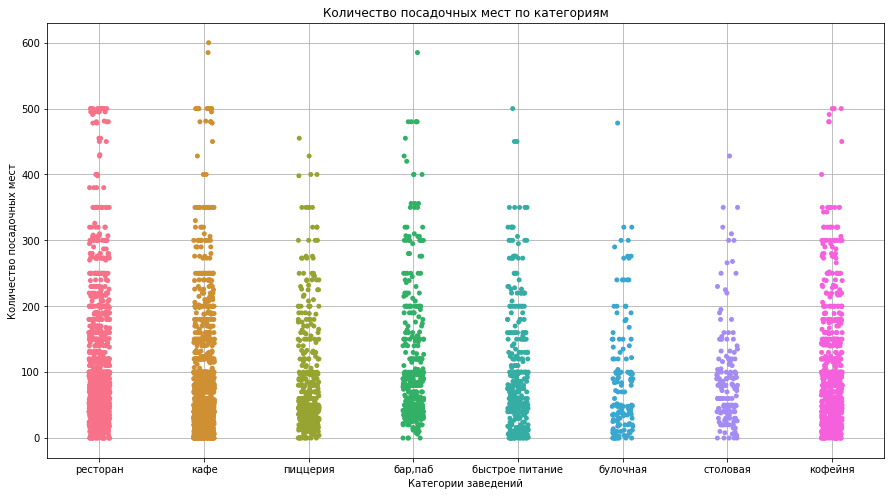

In [14]:
plt.figure(figsize=(15,8));

# строим график-полоску

sns.stripplot(x='category', y='seats', data=rests.query('seats.isna() != 1'), palette='husl') # исключаем данные с пропусками
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Категории заведений')
plt.ylabel('Количество посадочных мест')
plt.grid();

Из-за выбросов трудно разглядеть разницу, увеличим масштаб

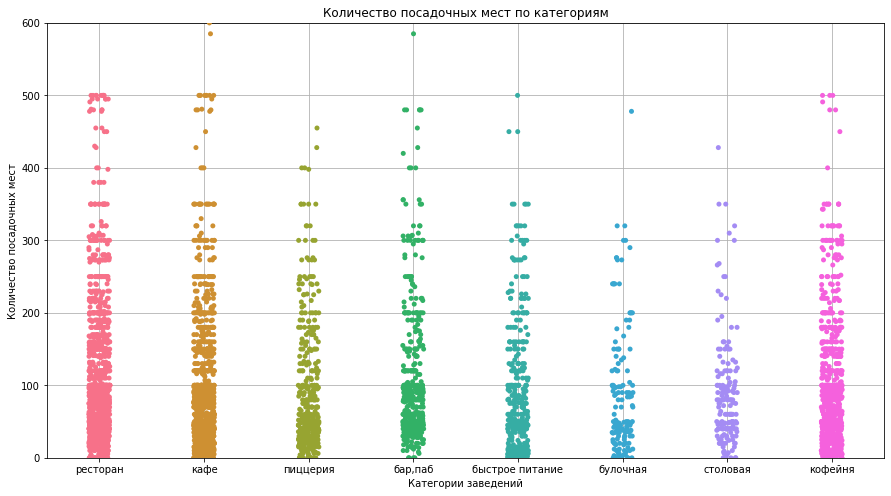

In [15]:
plt.figure(figsize=(15,8));

sns.stripplot(x='category', y='seats', data=rests.query('seats.isna() != 1'), palette='husl')
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Категории заведений')
plt.ylabel('Количество посадочных мест')
plt.ylim(0, 600) # Ограничиваем значения по оси у
plt.grid();

Такая картина тоже не особо много дает, разве что видно маленькое количество мест в булочных и столовых, лучше построить столбчатую диаграмму.

In [16]:
fig = px.bar(rests.groupby('category')['seats'].median().sort_values(ascending=False).reset_index(), 
             x='category', 
             y='seats', 
             color='category', 
             title='Медианное количество посадочных мест по категориям')

fig.update_layout(
    autosize=False,
    width=1000,
    height=650,
    xaxis_title='Категория заведения',
    yaxis_title='Количество мест',
    legend_title='Категория')

fig.show();

Бары и рестораны лидируют по медианному количеству посадочных мест. Далее количество мест плавно убывает вплоть до 50. Меньше всего мест в  булочных, что и было видно на графике-полоске.

Теперь посмотрим на долю сетевых и несетевых заведений

In [17]:
chains = ['сетевые', 'несетевые']
values = [rests['chain'].sum(), rests.shape[0] - rests['chain'].sum()]

fig = go.Figure(data=[go.Pie(labels=chains, values=values, pull = [0.1, 0])])
fig.update_layout(title='Соотношение сетевых заведений к несетевым', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show()

Несетевые заведения составляют чуть меньше трети от общего числа - 5201 точек.

Теперь посмотрим, какие категории чаще всего являются сетевыми

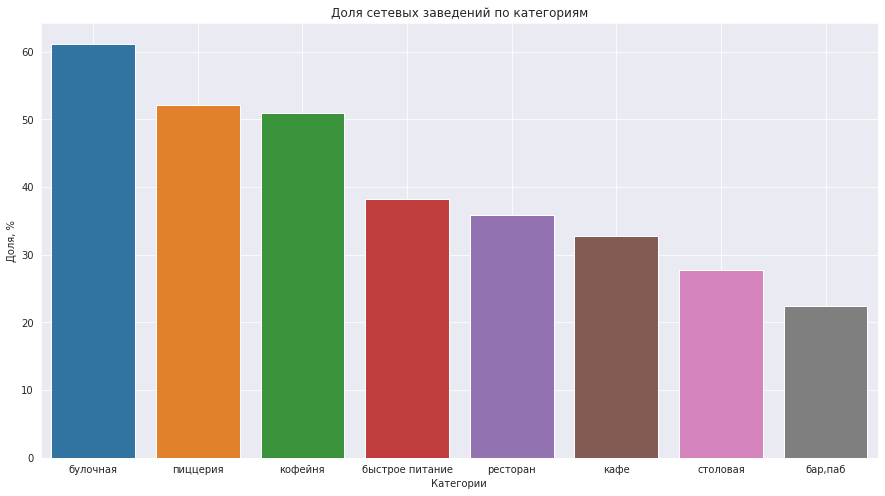

In [18]:
plt.figure(figsize=(15,8));

sns.set_style('dark')

# Подготавливаем данные

table = rests.groupby('category').agg({'chain': 'sum', 'address': 'count'}).reset_index().sort_values(by='address', ascending=False)

table['ratio'] = round(table['chain']/table['address']*100, 2)

sns.barplot(x='category', 
            y='ratio', 
            data=table.sort_values(by='ratio', ascending=False))
plt.title('Доля сетевых заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Доля, %')
plt.grid();

Зайдя в булочную, с высокой долей вероятности(0.6) можно утверждать, что она является частью какой-то сети. Чего не скажешь про бары и пабы: доля сетевых заведений здесь составляет лишь 21%. Кофейни и пиццерии поровну поделились на несетевые и сетевые.

In [19]:
# Подготавливаем данные

table = rests.groupby('name').agg({'address': 'count', 
                                   'category': 'max', }).reset_index().sort_values(by='address', ascending=False).head(15)
table = table.merge(rests.groupby('category')['name'].count().reset_index(), on='category')

table['ratio'] = round(table['address']/table['name_y']*100, 2)

table = table.sort_values(by='address')
table

fig = px.bar(table,
             x='address',
             y='name_x',
             color='category',
             title='Количество заведений одной сети по категориям (топ-15)')

fig.update_layout(xaxis_title='Число заведений',
                  yaxis_title='Название заведения',
                  legend_title='Категории')
fig.show();

fig = px.bar(table.sort_values(by='ratio', ascending=False),
             y='ratio',
             x='name_x',
             color='category',
             title='Доля таких заведений от общего числа по категориям')

fig.update_layout(xaxis_title='Название заведения',
                  yaxis_title='Доля, %',
                  legend_title='Категории',
                  height=600)
fig.show();

Самой популярной сетью является "Шоколадница" - 116 точек. Исключим отсюда "Кафе", "Шаурма" и "Ресторан", так как под этими названиями могут скрываться абсолютно несвязанные заведения. После "Шоколадницы" идет Домино'с Пицца и Додо Пиццы - количество точек у них примерно одинаково. Среди столовых сеть "Кафе" является абсолютным лидером, среди пиццерий додо и доминос составляют суммарно чуть больше 23% от общего числа заведений данной категории, остальные сети составляют менее 10% в своих категориях

Взглянем на то, как распределено количество заведений разных категорий по разным районам

In [20]:
table = rests.pivot_table(index='district', 
                          values='address', 
                          aggfunc='count').reset_index().merge(
        rests.pivot_table(index=['district', 'category'], 
                          values='name', 
                          aggfunc='count').reset_index(), on='district')

fig = px.bar(table.sort_values(by='address'), 
             x='name', 
             y='district', 
             color='category', 
             title='Количество заведений в разных районах по категориям',
             pattern_shape='category',                     # Создаем особые "сетки" для некоторых категорий
             pattern_shape_map={'кафе': '.', 
                                'быстрое питание': '', 
                                'бар,паб': '', 
                                'пиццерия': '', 
                                'ресторан': '.',
                                'кофейня': '',
                                'булочная': '',
                                'столовая': ''})

fig.update_layout(
    autosize=False,
    width=1000,
    height=650,
    xaxis_title='Количество заведений',
    yaxis_title='Районы',
    legend_title='Категории')

fig.show();

Больше всего заведений в ЦАО - 2242. Меньше всего в СЗАО - 409. Во всех районах по количеству точек питания выделяются кафе и рестораны. Во всех округах, кроме ЦАО, лидирует кафе, и только в центре Москвы преобладают рестораны.

Посчитаем средние рейтинги по категориям

In [21]:
# подготавливаем данные для диаграммы

rate = rests.groupby('category')['rating'].mean().sort_values(ascending=False).reset_index()
rate['rating'] = round(rate['rating'], 2)

fig = px.bar(rate, 
             x='category', 
             y='rating',
             color='rating',
             text='rating',
             title='Рейтинг заведений по категориям')

fig.update_layout(
    xaxis_title='Категория заведения',
    yaxis_title='Рейтинг')

fig.update_traces(textfont_size=15, textangle=0, textposition="outside", cliponaxis=False) # ставим числовые значения над столбами

fig.show()

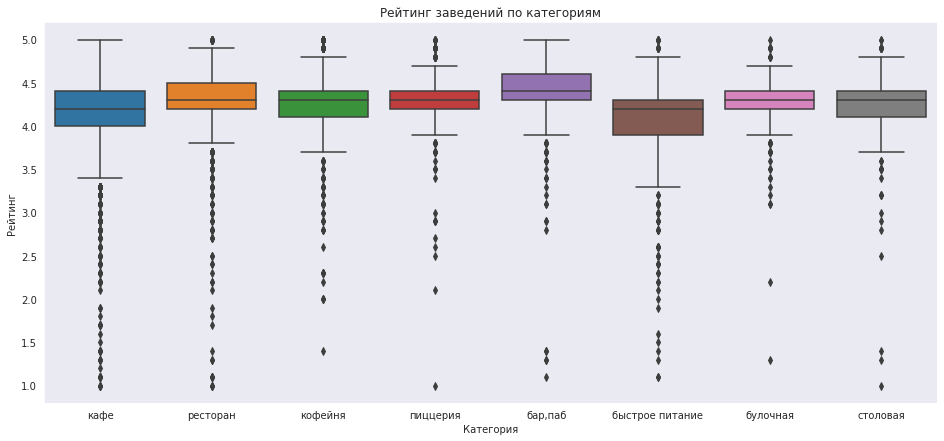

In [22]:
plt.figure(figsize=(16, 7))

sns.boxplot(x='category', y='rating', data=rests)
plt.title('Рейтинг заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг');

Наивысший средний рейтинг имеют бары и пабы - 4.39, но таким баллом не могут похвастаться точки быстрого питания - 4.05. Пиццерии, рестораны, кофейни и булочные имеют примерно одинаковый средний рейтинг - ~ 4.29.

Теперь построим хороплет с медианным рейтингом по районам.

In [23]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rests.groupby('district')['rating'].median(),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Как и ожидалось, наивысший рейтинг имеют заведения в центре города - 4.4, далее рейтинг примерно одинаков - 4.29, кроме СВАО и ЮВАО - тут средний рейтинг низший относительно других районов - 4.21.

Теперь отобразим все заведения на карте с помощью кластеров

In [24]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    icon_url = 'https://img.icons8.com/?size=512&id=AO8S0CzT52nA&format=png'  
    # создаём объект с собственной иконкой размером 30x30
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
rests.apply(create_clusters, axis=1)

# выводим карту
m

Видны четырехзначные числа в ЦАО, что было видно на предыдущей столбчатой диаграмме. На юге меньше всего заведений.

Теперь посмотирм на количество заведений разных категорий по улицам

In [25]:
table = (
        rests.pivot_table(index='street', 
                          values='address', 
                          aggfunc='count')
        .sort_values(by='address', ascending=False)
        .reset_index()
        .head(15)
        .merge(
              rests.pivot_table(index=['street', 'category'], 
                                values='name', 
                                aggfunc='count')
             .reset_index(), on='street')
             .sort_values(by='address')
        )

fig = px.bar(table, 
             x='name', 
             y='street', 
             color='category',
             pattern_shape='category',
             pattern_shape_map={'кафе': '.', 
                                'быстрое питание': '', 
                                'бар,паб': '', 
                                'пиццерия': '', 
                                'ресторан': '.',
                                'кофейня': '',
                                'булочная': '',
                                'столовая': ''},
             title='Количество заведений на разных улицах по категориям')

fig.update_layout(
    autosize=False,
    width=1000,
    height=800,
    xaxis_title='Количество заведений',
    yaxis_title='Улицы',
    legend_title='Категории')

fig.show();

Больше всего общепита на проспекте Мира - 184. Далее количество заведений плавно убывает вплоть до 48 точек на Пятницкой улице. Опять же видим большое количество кафе и ресторанов, но теперь не на всех улицах, например, на МКАДе практически нет ресторанов, зато больше половины заведений составляют кафе.

Теперь взгялнем на те улицы, на которых находится только одно заведение общепита

In [26]:
cafealone = rests[rests['street'] \
            .isin(rests.groupby('street')['name']
                  .count()
                  .sort_values()
                  .reset_index()
                  .query('name == 1')['street'])]

cafealone.info()
cafealone.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 474 entries, 15 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               474 non-null    object 
 1   category           474 non-null    object 
 2   address            474 non-null    object 
 3   district           474 non-null    object 
 4   hours              474 non-null    object 
 5   lat                474 non-null    float64
 6   lng                474 non-null    float64
 7   rating             474 non-null    float64
 8   price              183 non-null    object 
 9   avg_bill           196 non-null    object 
 10  middle_avg_bill    168 non-null    float64
 11  middle_coffee_cup  23 non-null     float64
 12  chain              474 non-null    int64  
 13  seats              153 non-null    float64
 14  street             474 non-null    object 
 15  is_24/7            441 non-null    object 
dtypes: float64(6), int64(1),

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережны,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовски,False


Всего у нас 474 улицы, на которых находится только одно заведение

In [27]:
print(round(cafealone['rating'].mean(), 4))
round(rests['rating'].mean(), 4)

4.227


4.2291

Средние рейтинги таких заведений никак не отличаются от общего среднего рейтинга

In [28]:
print(round(cafealone['middle_avg_bill'].mean(), 2))
round(rests['middle_avg_bill'].mean(), 2)

832.27


903.9

Оценка среднего чека тоже мало различается, всего на 71 рубль. Возможно доля круглосуточных заведений здесь наибольшая

In [29]:
print(round(cafealone['is_24/7'].sum()/cafealone.shape[0], 3))
round(rests[~rests['street'].isin(cafealone['street'])]['is_24/7'].sum()/\
rests[~rests['street'].isin(cafealone['street'])].shape[0], 3)

0.065


0.088

Доля круглосуточных заведений больше в общем списке на 2%. Можно сделать вывод, что такие заведения не отличаются по каким-либо значимым показателям, также такие заведения не обладают конкурентами по улице, и, скорее всего, посещаемость таких заведений большая.

Посмотрим на размер средних чеков по районам

In [30]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rests.query('middle_avg_bill.isna() != 1').groupby('district')['middle_avg_bill'].median(),
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(m)

# выводим карту
display(
    rests.query('middle_avg_bill.isna() != 1')
    .groupby('district')['middle_avg_bill']
    .median().sort_values(ascending=False).reset_index()
     )
m

,district,middle_avg_bill
0,Центральный административный округ,1000.0
1,Западный административный округ,975.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,550.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


Очевидно, что в ЦАО средний чек будет наибольшим, далее идет ЗАО - в обоих районах средний чек примерно равен 1 тыс. рублей, наименьший средний чек в СВАО и ЮВАО.

### Промежуточный вывод по этапу анализа данных

- Самыми популярными категориями заведений общепита в Москве являются кафе, рестораны и кофейни. Булочные и столовые суммарно составляют ~7% от общего числа заведений.

- Несетевые заведения составляют чуть меньше трети от общего числа - 5144 точек. Зайдя в булочную, с высокой долей вероятности(0.6) можно утверждать, что она является частью какой-то сети. Чего не скажешь про бары и пабы: доля сетевых заведений здесь составляет лишь 21%. Кофейни и пиццерии поровну поделились на несетевые и сетевые.

- Самой популярной сетью является "Шоколадница" - 120 точек. После "Шоколадницы" идет "Домино'с Пицца" и "Додо Пицца" - количество точек у них примерно одинаково.

- Больше всего заведений в ЦАО - 2219. Меньше всего в СЗАО - 409. Во всех районах по количеству точек питания выделяются кафе и рестораны. Во всех округах, кроме ЦАО, лидирует кафе, и только в центре Москвы преобладают рестораны.

- Наивысший средний рейтинг имеют бары и пабы - 4.39, но таким баллом не могут похвастаться точки быстрого питания - 4.05. Пиццерии, рестораны, кофейни и булочные имеют примерно одинаковый средний рейтинг - ~4.29.

- Больше всего общепита на проспекте Мира - 183. Далее количество заведений плавно убывает вплоть до 42 точек на Пятницкой улице. Опять же видим большое количество кафе и ресторанов, но теперь не на всех улицах, например, на МКАДе практически нет ресторанов, зато больше половины заведений составляют кафе.

- В ЦАО средний чек наибольший, далее идет ЗАО - в обоих районах средний чек примерно равен 1 тыс. рублей, наименьший средний чек в СВАО и ЮВАО.

## Детализирование исследования (открытие кофейни)

Теперь попробуем дать рекомендации для открытия кофейни, для начала отфильтруем изначальный датафрейм, оставив только кофейни

In [31]:
coffee = rests.query('category == "кофейня"') # фильтруем датасет
print('Количество кофеен', coffee.shape[0])
coffee.sample(5)

Количество кофеен 1395


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
5123,ZinTea,кофейня,"Москва, Стремянный переулок, 38",Центральный административный округ,"ежедневно, 10:00–22:00",55.727152,37.626423,4.5,средние,Средний счёт:300–500 ₽,400.0,NaN,0,94.0,Стремянный переулок,False
4497,Cofix,кофейня,"Москва, Нижний Сусальный переулок, 5, стр. 1",Центральный административный округ,"пн-пт 07:00–22:00; сб,вс 08:00–21:00",55.761264,37.662809,4.1,NaN,Цена чашки капучино:от 60 ₽,NaN,60.0,1,95.0,Нижний Сусальный переулок,False
6821,One Price Coffee,кофейня,"Москва, улица Миклухо-Маклая, 32А",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.641227,37.529458,4.0,NaN,NaN,NaN,NaN,1,65.0,улица Миклухо-Маклая,False
2252,Shawarma VIP House,кофейня,"Москва, проезд Сокольнического Круга, 11А",Восточный административный округ,"ежедневно, 10:00–22:00",55.793531,37.677553,4.3,NaN,NaN,NaN,NaN,1,NaN,проезд Сокольнического Круга,False
7086,Кофейня,кофейня,"Москва, Электролитный проезд, 3Б, стр. 6",Южный административный округ,пн-пт 09:00–20:00,55.675945,37.613319,3.3,NaN,NaN,NaN,NaN,0,8.0,Электролитный проезд,False


Всего в Москве 1413 кофеен

In [32]:
chains = ['сетевые', 'несетевые']
values = [coffee['chain'].sum(), coffee.shape[0] - coffee['chain'].sum()]

fig = go.Figure(data=[go.Pie(labels=chains, values=values)])
fig.update_layout(title='Соотношение сетевых заведений к несетевым', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show()

Почти половина кофейнь являются сетевыми

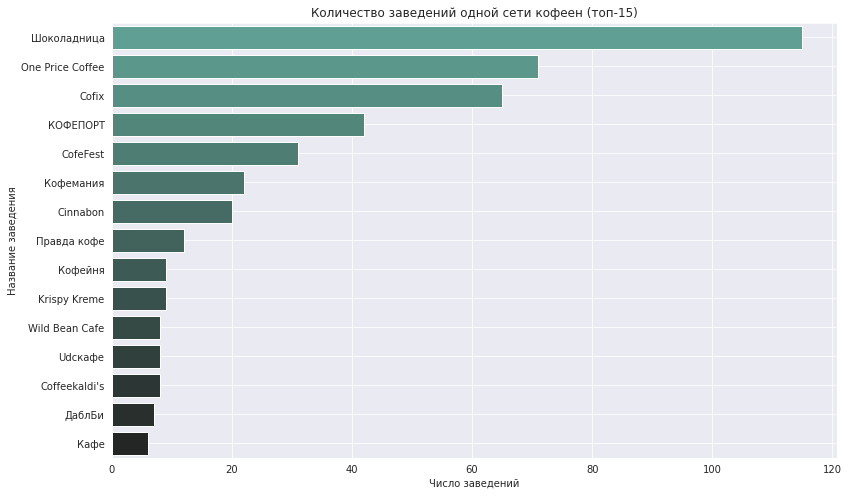

In [33]:
plt.figure(figsize=(13,8));

sns.barplot(y='name', 
            x=coffee.groupby('name').agg({'address': 'count'}).reset_index().sort_values(by='address', ascending=False).head(15)['address'].to_list(), 
            data=coffee.groupby('name').agg({'address': 'count'}).reset_index().sort_values(by='address', ascending=False).head(15),
            palette='dark:#5A9_r')
plt.title('Количество заведений одной сети кофеен (топ-15)')
plt.xlabel('Число заведений')
plt.ylabel('Название заведения')
plt.grid();

Самыми популярыми сетями кофеен являются "Шоколадница", "One Price Coffee", "Cofix", "КОФЕПОРТ" И "CofeFest".

In [34]:
districts = coffee.groupby('district')['name'].count().sort_values(ascending=False).reset_index()['district']
values = coffee.groupby('district')['name'].count().sort_values(ascending=False).reset_index()['name']

fig = go.Figure(data=[go.Pie(labels=districts, values=values, pull = [0.1, 0])])
fig.update_layout(title='Количество кофеен по районам', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Район',
                                    showarrow=False)])
fig.show()

Как и ожидалось, 30% кофеен находится в центре Москвы, меньше всего в СЗАО - 4.4%

In [35]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee.groupby('district')['rating'].mean(),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

Интересно, что средний рейтинг в ЦАО и СЗАО одинаковый, самый низкий в ЗАО и СВАО.

In [36]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    icon_url = 'https://img.icons8.com/?size=512&id=wk950Iq6BGSS&format=png'  
    # создаём объект с собственной иконкой размером 30x30
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# выводим карту
m

На юге и востоке меньше кофеен относительно других районов, причем видно, что многие кофенйи очень часто сосредоточены на одном участке, скорее всего недалеко от этих участков находятся бизнес-центры и подобные административные здания, так как многие сотрудники во время обеда идут пить кофе.

In [37]:
fig = px.bar(coffee.groupby('street')['name'].count().reset_index().sort_values(by='name').tail(15), 
             x='name', 
             y='street',
             title='Количество кофеен на разных улицах')

fig.update_layout(
    xaxis_title='Количество кофеен',
    yaxis_title='Улицы')

fig.show();

Этот топ похож на тот, что был для всех заведений ранее, больше всего кофееен на проспекте Мира - 36 заведений

In [38]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee.query('middle_coffee_cup.isna() != 1').groupby('district')['middle_coffee_cup'].mean(),
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя цена чашки кофе кофеен по районам',
).add_to(m)

# выводим карту
m

Средняя цена за чашку кофе одинакова в ЦАО, ЗАО и ЮЗАО - около 190 руб. Самый дешевый кофе можно найти в ЮВАО - ~ 155 руб.

In [39]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee.query('middle_avg_bill.isna() != 1').groupby('district')['middle_avg_bill'].mean(),
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек кофеен по районам',
).add_to(m)

# выводим карту
m

Очевидно, самый высокий средний чек в центре - почти 800 руб. Самый низкий, как и средняя цена за кофе, в ЮВАО.

Посмотрим, может есть какая-либо зависимость между рейтингом и средним чеком

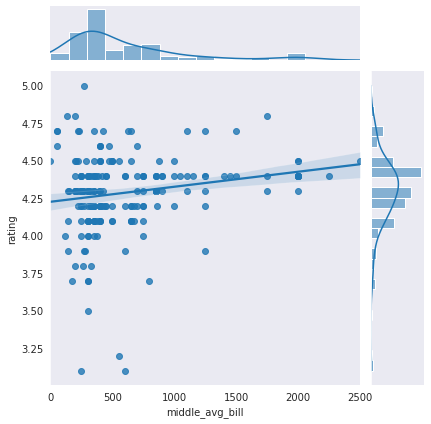

In [40]:
sns.jointplot(x='middle_avg_bill', y='rating', data=coffee.query('middle_avg_bill.isna() != 1'), kind='reg');

# не считаем пропуски

Зависимость очень слабая, очевидно, что  выгодное расположение кофейни и хорошая работа персонала тоже влияют на рейтинг, поэтому кофейни, которые обладают этими признаками, обладают рейтингом немного выше, ну и средний чек тоже будет чуть выше.

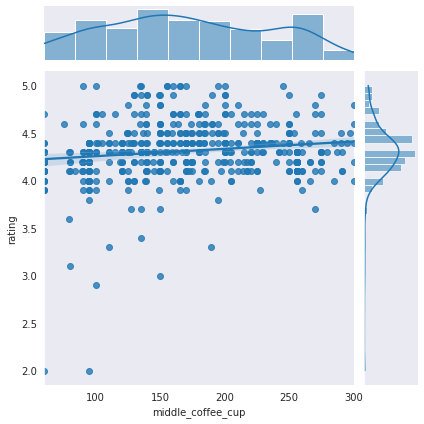

In [41]:
sns.jointplot(x='middle_coffee_cup', y='rating', data=coffee.query('middle_coffee_cup.isna() != 1'), kind='reg');

# не считаем пропуски

Такая же ситуация наблюдается и здесь: очень слабая зависимость между рейтингом и средней ценой за чашку кофе. Посмотрим теперь, сколько кофеен работает круглосуточно

In [42]:
print(coffee[coffee['is_24/7'] == True]['name'].count())
round(coffee[coffee['is_24/7'] == True]['name'].count()/coffee.shape[0], 4)

59


0.0423

Всего 4% от общего числа кофеен являются круглосуточными заведениями - 59 кофеен работают 24/7

In [43]:
print(round(coffee.query('chain == 1')['rating'].mean(), 2))

round(coffee.query('chain == 0')['rating'].mean(), 2)

4.21


4.35

Интересен тот факт, что несетевые кофейни обладают средним рейтингом на 0.14 единиц выше, чем сетевые

Чтобы определить подходящее место для кофейни, посмотрим на расположение самых популярных сетей

In [44]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    icon_url = 'https://img.icons8.com/?size=512&id=wk950Iq6BGSS&format=png'  
    # создаём объект с собственной иконкой размером 30x30
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.query('name == "Шоколадница" or name == "One Price Coffee" or name == "Cofix" or name == "КОФЕПОРТ" or name == "CofeFest"') \
      .apply(create_clusters, axis=1)

# выводим карту
m

В ЗАО, ЮВАО, а также в северной части ВАО плотность таких сетей наименьшая, хотя в ВАО такое явление обусловлено тем, что там территория нац. парка "Лосиный остров".

### Промежуточный вывод по этапу открытия кофейни

**Рекомендации** по открытию кофейни в Москве:

На начальном этапе не стоит связываться с сетевыми "гигантами"(если планируется развивать целую сеть), нужно расположить кофейню на территории ЗАО или ЮВАО около бизнец-центров и подобных административных зданий, но подальше от промзоны, которая занимает значительную часть территории ЗАО, тем более в ЗАО один из самых низких средних рейтингов, возможно здесь легче будет начинать дела. 

Что касается цены за чашку капучино, то нужно ориентироваться на цены, характерные для данного региона - 190 руб, но чуть меньше - например, 175 руб., возможно это привлечет внимание посетителей на начальном этапе. Когда определенная база клиентов будет сформирована, где-то через полгода работы повысить ее до цены, немного выше средней - например 210, чтобы начать окупать купленное оборудование и аренду помещения. Затем, если дела пойдут хорошо, можно начать развивать целую сеть кофеен.

## Презентация

Презентация: https://disk.yandex.ru/i/N9fhCEhXjCzaRA

## Общий вывод

В нашем распоряжении был датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Нужно было подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Цели исследования были достигнуты:**

- Проведено исследование рынка заведений общественного питания Москвы

- Даны рекомендации по выбору места и категории заведения общественного питания

Были созданы два новых столбца : is_24/7 и столбец с названием улицы $street$.

Было обнаружено большое количество пропусков, устранить их удлось лишь в столбце с часами работы заведения - заполнили значением "unknown".

Явных дубликатов обнаружено не было, а вот неявные были, например "Доминос" и "Домино'с Пицца", все они были устранены

Были обнаружены аномальные значения, после их удаления осталось 8317 строк

Изменить тип данных в столбце с количеством посадочных мест не требовалось, потому что ввиду наличия пропусков нельзя изменить тип данных на int. Не страшно, это не навредило исследованию.

**Были получены основные тезисы после анализа данных:**

- Самыми популярными категориями заведений общепита в Москве являются кафе, рестораны и кофейни. 

- Несетевые заведения составляют чуть меньше трети от общего числа - 5144 точек. 

- Самой популярной сетью является "Шоколадница" - 120 точек. П

- Больше всего заведений в ЦАО - 2219. Меньше всего в СЗАО - 409. 

- Наивысший средний рейтинг имеют бары и пабы - 4.39

- Больше всего общепита на проспекте Мира - 184. 

- В ЦАО средний чек наибольший

**Были даны рекомендации по открытию кофейни:**

На начальном этапе не стоит связываться с сетевыми "гигантами"(если планируется развивать целую сеть), нужно расположить кофейню на территории ЗАО или ЮВАО около бизнец-центров и подобных административных зданий, но подальше от промзоны, которая занимает значительную часть территории ЗАО, тем более в ЗАО один из самых низких средних рейтингов, возможно здесь легче будет начинать дела.

Что касается цены за чашку капучино, то нужно ориентироваться на цены, характерные для данного региона - 190 руб, но чуть меньше - например, 175 руб., возможно это привлечет внимание посетителей на начальном этапе. Когда определенная база клиентов будет сформирована, где-то через полгода работы повысить ее до цены, немного выше средней - например 210, чтобы начать окупать купленное оборудование и аренду помещения. Затем, если дела пойдут хорошо, можно начать развивать целую сеть кофеен.